##**Notebook PC#08**
## Simple Recurrent Neural Network, Linear Predictor, MLP and LSTM for multi-step time series prediction.<BR>

**Professor:** Fernando J. Von Zuben <br>
**Aluno(a):** Beatriz Akiria de Assis Quaresma - 203899 <br>
**Aluno(a):** Decio Miranda Filho - 236087

In [ ]:
# Loading all the relevant libraries
from pandas import read_csv
from pandas import DataFrame
import numpy as np
import pandas as pd
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN, LSTM, GRU
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import math
import matplotlib.pyplot as plt

## **A base [unemployment rate] foi baixada no [link](https://fred.stlouisfed.org/series/UNRATE).**

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive/')

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Structuring the dataset from a single time series, scaling and spliting into training / testing
def get_train_test(dataset, split_percent, time_steps, horizon):
    df = read_csv(dataset, usecols=[1], engine='python')
    data = np.array(df.values.astype('float32'))
    scaler = MinMaxScaler(feature_range=(0, 1))
    # There is a kind of data leakage in the next command
    data = scaler.fit_transform(data).flatten()
    n = len(data)
    df = DataFrame()
    for i in range(0,time_steps):
      df['t-' + str(time_steps-i-1)] = [data[j] for j in range(i, (len(data)-horizon-time_steps+i+1))]
    for i in range(1,horizon+1):
      df['t+' + str(i)] = [data[j] for j in range(time_steps+i-1, (len(data)-horizon+i))]
    print(df)
    df1 = df.copy()
    for i in range(1,horizon+1):
      df1 = df1.drop(['t+' + str(i)], axis = 1)
    dataX = np.array(df1) #separacao de dados de time_steps
    df2 = df['t+1']
    for i in range(2,horizon+1):
      df2 = pd.concat([df2, df['t+' + str(i)]], axis=1)
    datay = np.array(df2) #separacao de dados de horizon
    # Point for splitting data into train and test
    split = int(n*split_percent)
    X = dataX[range(split),:]
    y = datay[range(split)]
    Xt = dataX[split:,:]
    yt = datay[split:]
    return X, y, Xt, yt

time_steps = 11
horizon = 3
# Here you will decide which dataset to consider.
X, y, Xt, yt = get_train_test('/content/drive/MyDrive/Projetos Computacionais - Redes Neurais/Projetos 2/unemployment_rate.csv', 0.8, time_steps, horizon)
#X, y, Xt, yt = get_train_test('/content/drive/MyDrive/Projetos Computacionais - Redes Neurais/Projetos 2/monthly_sunspot.csv', 0.8, time_steps, horizon)

         t-10       t-9       t-8       t-7       t-6       t-5       t-4  \
0    0.073171  0.105691  0.121951  0.113821  0.081301  0.089431  0.089431   
1    0.105691  0.121951  0.113821  0.081301  0.089431  0.089431  0.113821   
2    0.121951  0.113821  0.081301  0.089431  0.089431  0.113821  0.105691   
3    0.113821  0.081301  0.089431  0.089431  0.113821  0.105691  0.097561   
4    0.081301  0.089431  0.089431  0.113821  0.105691  0.097561  0.105691   
..        ...       ...       ...       ...       ...       ...       ...   
897  0.089431  0.089431  0.081301  0.073171  0.089431  0.081301  0.073171   
898  0.089431  0.081301  0.073171  0.089431  0.081301  0.073171  0.097561   
899  0.081301  0.073171  0.089431  0.081301  0.073171  0.097561  0.089431   
900  0.073171  0.089431  0.081301  0.073171  0.097561  0.089431  0.081301   
901  0.089431  0.081301  0.073171  0.097561  0.089431  0.081301  0.105691   

          t-3       t-2       t-1       t-0       t+1       t+2       t+3  

In [ ]:
print(X.shape)
print(y.shape)

(732, 11)
(732, 3)


## **Implementing the simple recurrent neural network**

In [ ]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def create_RNN(hidden_units, dense_units, input_shape, activation):
        model = Sequential()
        model.add(SimpleRNN(hidden_units, activation=activation[0], input_shape=input_shape))
        model.add(Dense(units=dense_units, activation=activation[1]))
        model.compile(loss='mean_squared_error', optimizer='adam')
        return model

def RNN_predictor (X, y, time_steps):
    model = create_RNN(hidden_units=30, dense_units=horizon, input_shape=(time_steps,1), activation=['tanh', 'tanh'])
    train_predict = model.fit(X, y, epochs=20, batch_size=1, verbose=2)
    return model

RNN_model = RNN_predictor(X, y, time_steps)

Epoch 1/20
732/732 - 3s - loss: 0.0037 - 3s/epoch - 4ms/step
Epoch 2/20
732/732 - 2s - loss: 0.0013 - 2s/epoch - 2ms/step
Epoch 3/20
732/732 - 3s - loss: 9.9884e-04 - 3s/epoch - 4ms/step
Epoch 4/20
732/732 - 3s - loss: 8.7301e-04 - 3s/epoch - 4ms/step
Epoch 5/20
732/732 - 2s - loss: 8.1805e-04 - 2s/epoch - 3ms/step
Epoch 6/20
732/732 - 2s - loss: 8.0283e-04 - 2s/epoch - 3ms/step
Epoch 7/20
732/732 - 2s - loss: 7.6002e-04 - 2s/epoch - 3ms/step
Epoch 8/20
732/732 - 2s - loss: 7.3795e-04 - 2s/epoch - 3ms/step
Epoch 9/20
732/732 - 2s - loss: 7.2500e-04 - 2s/epoch - 3ms/step
Epoch 10/20
732/732 - 3s - loss: 7.2627e-04 - 3s/epoch - 3ms/step
Epoch 11/20
732/732 - 3s - loss: 7.1403e-04 - 3s/epoch - 4ms/step
Epoch 12/20
732/732 - 2s - loss: 7.1830e-04 - 2s/epoch - 3ms/step
Epoch 13/20
732/732 - 2s - loss: 6.8967e-04 - 2s/epoch - 3ms/step
Epoch 14/20
732/732 - 2s - loss: 7.0870e-04 - 2s/epoch - 3ms/step
Epoch 15/20
732/732 - 2s - loss: 7.1098e-04 - 2s/epoch - 3ms/step
Epoch 16/20
732/732 - 2s - 

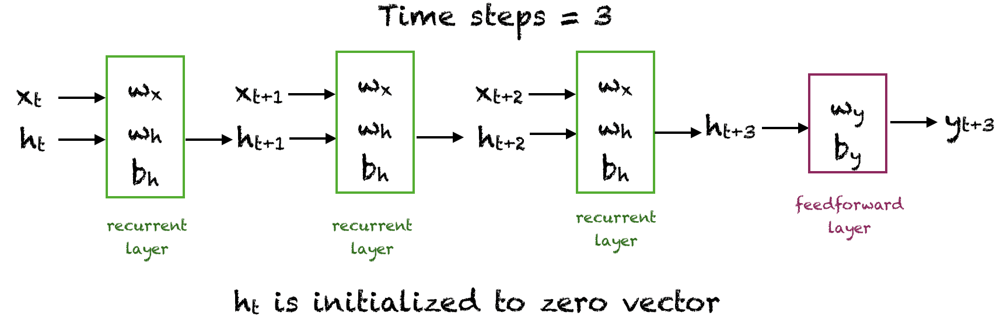

In [ ]:
# [Do not run this cell] or [Upload the PNG file and then run].
# Configuration of the simple RNN
from IPython.display import Image
Image("RNN_info_flow.png", width = 600, height = 300)

In [ ]:
wx = RNN_model.get_weights()[0]
wh = RNN_model.get_weights()[1]
bh = RNN_model.get_weights()[2]
wy = RNN_model.get_weights()[3]
by = RNN_model.get_weights()[4]
print(wx.shape)
print(wh.shape)
print(bh.shape)
print(wy.shape)
print(by.shape)

(1, 30)
(30, 30)
(30,)
(30, 3)
(3,)


## **Implementing a linear predictor**

In [ ]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def linear_predictor(X,y):
    model = LinearRegression()
    train_predict = model.fit(X, y)
    print(model.coef_)
    print(model.intercept_)

    return model

linear_model = linear_predictor(X,y)

[[ 0.11851811 -0.12171889 -0.02107678  0.05709181 -0.03613607 -0.1277338
   0.03432588 -0.0803625  -0.07273654  0.2400809   0.9935694 ]
 [ 0.07581855  0.04241052 -0.134515    0.02920142  0.01571846 -0.15734799
  -0.09819799 -0.0460189  -0.15392885  0.16570777  1.2284961 ]
 [ 0.21077284 -0.12918374 -0.00265026 -0.06813775 -0.01591381 -0.13397385
  -0.10556133 -0.18870555 -0.14540194  0.13890208  1.3892753 ]]
[0.00447309 0.008991   0.01394928]


## **Implementing the multilayer perceptron neural network (MLP)**

In [ ]:
# Execute this cell or the cell associated with one of the other predictors. They are mutually exclusive.
def MLP_predictor():
  model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(80, activation=tf.nn.tanh),
    tf.keras.layers.Dropout(0.3),
    tf.keras.layers.Dense(horizon, activation='linear')
  ])
  model.compile(optimizer='adam', loss='mean_squared_error')
  train_predict = model.fit(X, y, epochs=100)
  model.summary()

  return model

MLP_model = MLP_predictor()

Epoch 1/100
23/23 [==============================] - 1s 4ms/step - loss: 0.0286
Epoch 2/100
23/23 [==============================] - 0s 8ms/step - loss: 0.0181
Epoch 3/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0130
Epoch 4/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0103
Epoch 5/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0074
Epoch 6/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0062
Epoch 7/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0048
Epoch 8/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0039
Epoch 9/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0034
Epoch 10/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0031
Epoch 11/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0027
Epoch 12/100
23/23 [==============================] - 0s 2ms/step - loss: 0.0025
Epoch 13/100
23/23 [=================

## **Implementing the long short-term memory network (LSTM)**

In [ ]:
def LSTM_predictor(X, y, time_steps):
    X1 = X.reshape(X.shape[0],time_steps,1)
    model=Sequential()
    model.add(LSTM(25,input_shape=(time_steps,1)))
    model.add(Dense(horizon,activation='linear'))
    model.compile(loss='mean_squared_error',optimizer='adam')

    train_predict = model.fit(X1,y,epochs=200,verbose=2)

    return model

LSTM_model = LSTM_predictor(X, y, time_steps)
print(LSTM_model.summary())

Epoch 1/200
23/23 - 3s - loss: 0.0280 - 3s/epoch - 132ms/step
Epoch 2/200
23/23 - 0s - loss: 0.0057 - 267ms/epoch - 12ms/step
Epoch 3/200
23/23 - 0s - loss: 0.0046 - 207ms/epoch - 9ms/step
Epoch 4/200
23/23 - 0s - loss: 0.0039 - 203ms/epoch - 9ms/step
Epoch 5/200
23/23 - 0s - loss: 0.0035 - 216ms/epoch - 9ms/step
Epoch 6/200
23/23 - 0s - loss: 0.0034 - 275ms/epoch - 12ms/step
Epoch 7/200
23/23 - 0s - loss: 0.0033 - 200ms/epoch - 9ms/step
Epoch 8/200
23/23 - 0s - loss: 0.0032 - 259ms/epoch - 11ms/step
Epoch 9/200
23/23 - 0s - loss: 0.0030 - 247ms/epoch - 11ms/step
Epoch 10/200
23/23 - 0s - loss: 0.0029 - 222ms/epoch - 10ms/step
Epoch 11/200
23/23 - 0s - loss: 0.0028 - 221ms/epoch - 10ms/step
Epoch 12/200
23/23 - 0s - loss: 0.0027 - 329ms/epoch - 14ms/step
Epoch 13/200
23/23 - 0s - loss: 0.0025 - 304ms/epoch - 13ms/step
Epoch 14/200
23/23 - 0s - loss: 0.0023 - 229ms/epoch - 10ms/step
Epoch 15/200
23/23 - 0s - loss: 0.0021 - 212ms/epoch - 9ms/step
Epoch 16/200
23/23 - 0s - loss: 0.0020 - 

In [ ]:
def print_error(trainY, testY, train_predict, test_predict,i):
    # Error of predictions
    train_rmse = math.sqrt(mean_squared_error(trainY, train_predict))
    test_rmse = math.sqrt(mean_squared_error(testY, test_predict))
    # Print RMSE
    print('t+%d RMSE train: %.3f RMSE' % (i+1, train_rmse))
    print('t+%d RMSE test: %.3f RMSE' % (i+1, test_rmse))
    return [train_rmse, test_rmse]


def RMSE(train_predict, test_predict):
  rmse = []
  for i in range(horizon):
    if(horizon == 1):
      y1_pred = train_predict
      y1_pred_t = test_predict
      y1 = y
      y1_t = yt
    elif(horizon > 1):
      y1_pred = train_predict[:,i]
      y1_pred_t = test_predict[:,i]
      y1 = y[:,i]
      y1_t = yt[:,i]

    erro = print_error(y1, y1_t, y1_pred, y1_pred_t,i)
    rmse.append(erro)

  # Create a DataFrame from the rmse values for each horizon
  df = pd.DataFrame(rmse)
  df.columns = ['train', 'test']
  return df


In [ ]:
# Plot the predictions together with the actual values
def plot_result(trainY, testY, train_predict, test_predict,i):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(30, 6), dpi=300)
    plt.plot(range(rows), actual)
    plt.plot(range(rows), predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.legend(['Actual', 'Predictions'])
    plt.xlabel('Time steps')
    plt.ylabel('Actual and Predicted Values')
    plt.title('t+%d Predition (The Red Line Separates The Training And Test Examples)' % (i+1))
    plt.grid(True)

def plot_predict(train_predict, test_predict, y, yt):
  for i in range(horizon):
    if(horizon == 1):
      y1_pred = train_predict
      y1_pred_t = test_predict
      y1 = y
      y1_t = yt
    elif(horizon > 1):
      y1_pred = train_predict[:,i]
      y1_pred_t = test_predict[:,i]
      y1 = y[:,i]
      y1_t = yt[:,i]
    plot_result(y1, y1_t, y1_pred, y1_pred_t,i)


***** RNN MODEL *****
6/6 [==============================] - 0s 4ms/step
t+1 RMSE train: 0.019 RMSE
t+1 RMSE test: 0.068 RMSE
t+2 RMSE train: 0.024 RMSE
t+2 RMSE test: 0.095 RMSE
t+3 RMSE train: 0.032 RMSE
t+3 RMSE test: 0.112 RMSE


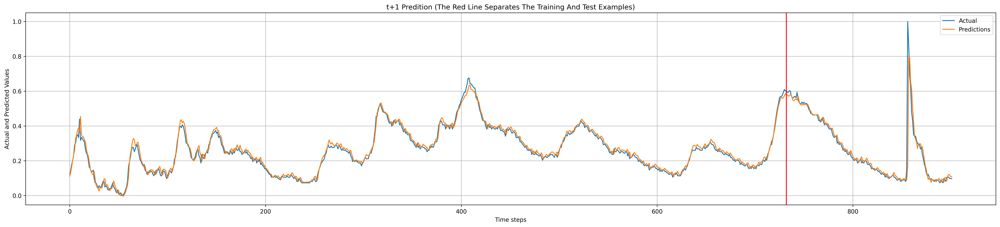

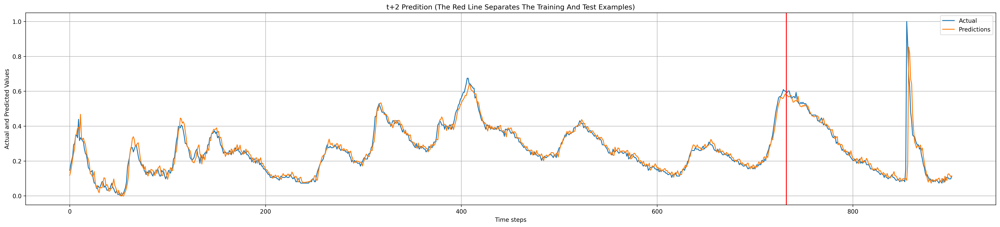

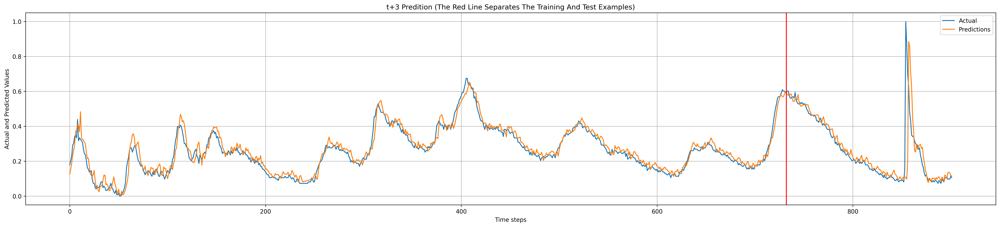

In [ ]:
print ('***** RNN MODEL *****')
train_predict = RNN_model.predict(X)
test_predict = RNN_model.predict(Xt)
df1 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** LINEAR MODEL *****
t+1 RMSE train: 0.016 RMSE
t+1 RMSE test: 0.077 RMSE
t+2 RMSE train: 0.022 RMSE
t+2 RMSE test: 0.114 RMSE
t+3 RMSE train: 0.030 RMSE
t+3 RMSE test: 0.141 RMSE


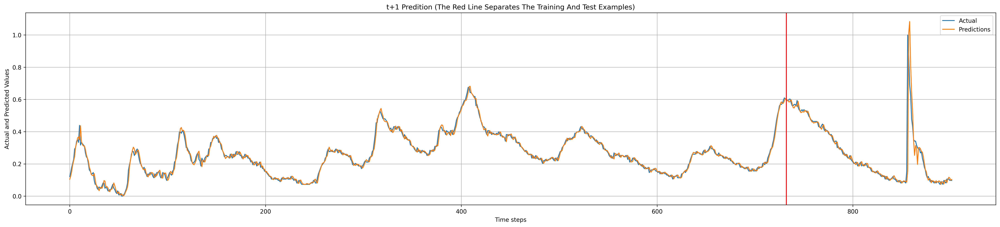

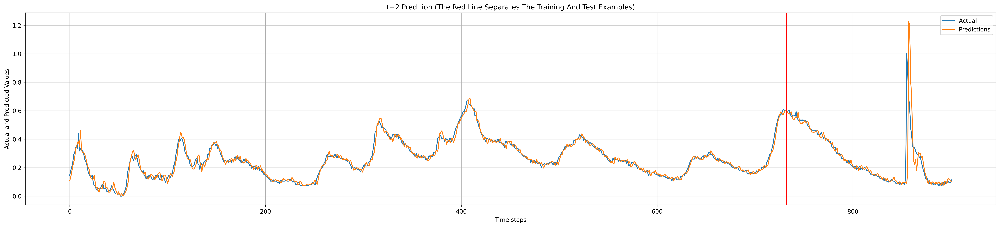

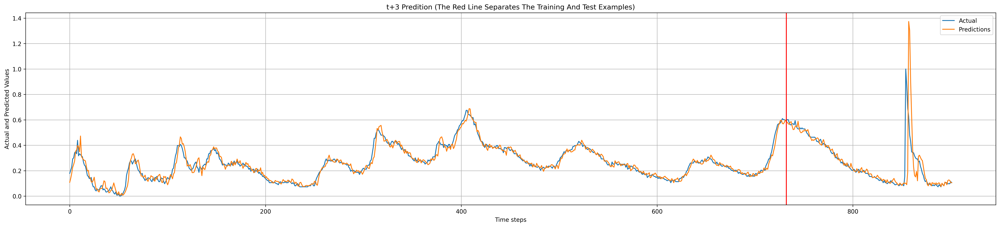

In [ ]:
print ('***** LINEAR MODEL *****')
train_predict = linear_model.predict(X)
test_predict = linear_model.predict(Xt)
df2 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** MLP MODEL *****
6/6 [==============================] - 0s 4ms/step
t+1 RMSE train: 0.017 RMSE
t+1 RMSE test: 0.079 RMSE
t+2 RMSE train: 0.023 RMSE
t+2 RMSE test: 0.116 RMSE
t+3 RMSE train: 0.030 RMSE
t+3 RMSE test: 0.139 RMSE


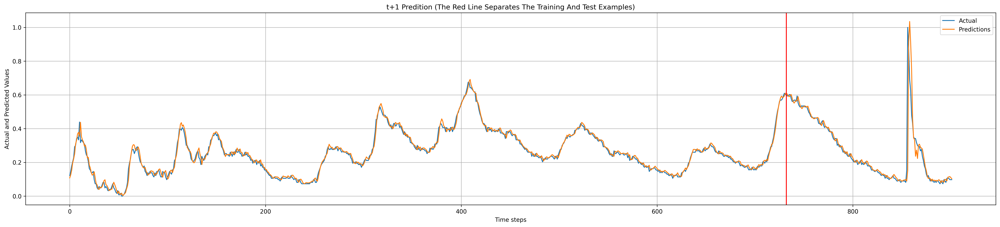

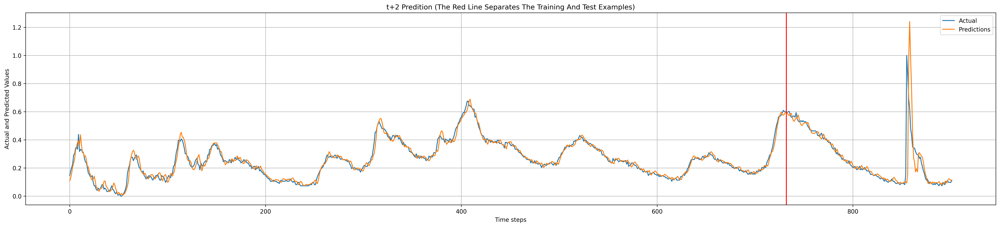

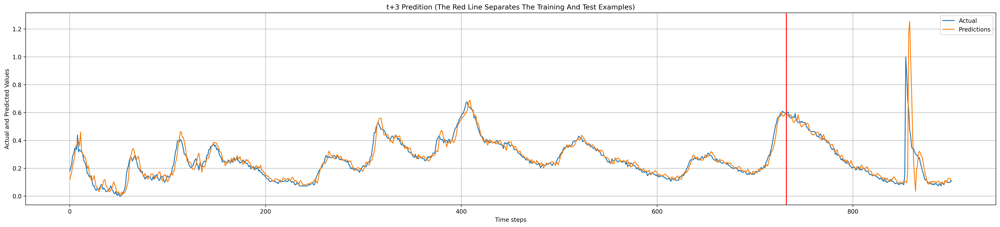

In [ ]:
print ('***** MLP MODEL *****')
train_predict = MLP_model.predict(X)
test_predict = MLP_model.predict(Xt)
df3 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

***** LSTM MODEL *****
6/6 [==============================] - 0s 6ms/step
t+1 RMSE train: 0.017 RMSE
t+1 RMSE test: 0.078 RMSE
t+2 RMSE train: 0.023 RMSE
t+2 RMSE test: 0.111 RMSE
t+3 RMSE train: 0.031 RMSE
t+3 RMSE test: 0.137 RMSE


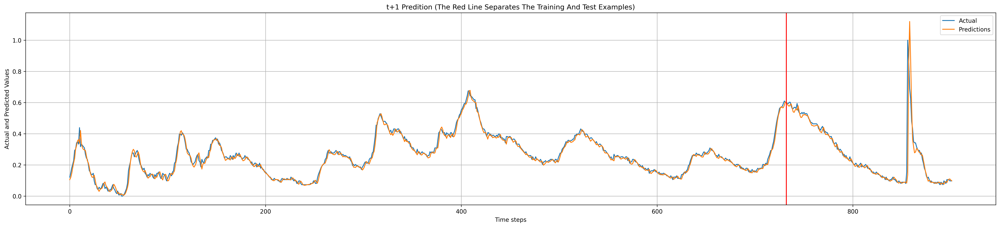

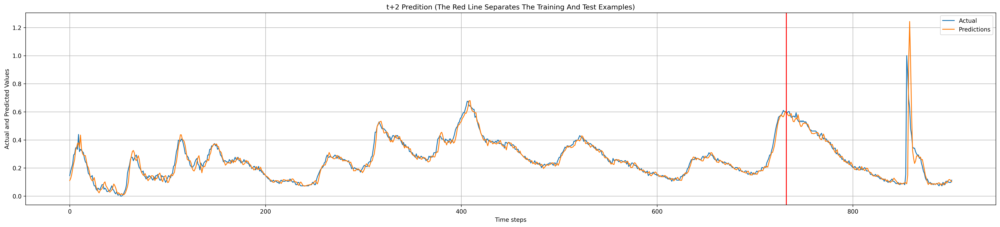

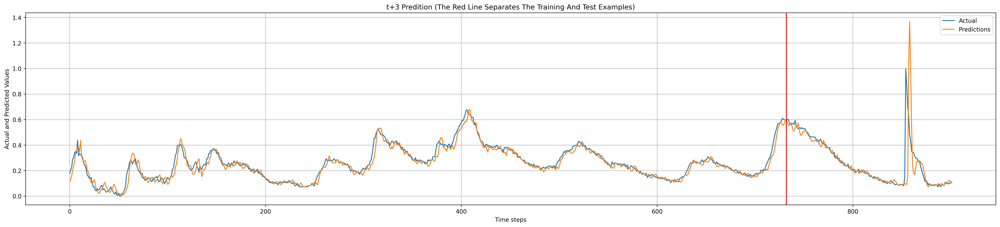

In [ ]:
print ('***** LSTM MODEL *****')
train_predict = LSTM_model.predict(X)
test_predict = LSTM_model.predict(Xt)
df4 = RMSE(train_predict, test_predict)
plot_predict(train_predict, test_predict, y, yt)

In [ ]:
# Plot the prediction error
def plot_result2(trainY, testY, train_predict, test_predict,i):
    actual = np.append(trainY, testY)
    predictions = np.append(train_predict, test_predict)
    rows = len(actual)
    plt.figure(figsize=(30, 6), dpi=300)
    plt.plot(range(rows), actual - predictions)
    plt.axvline(x=len(trainY), color='r')
    plt.xlabel('Time steps')
    plt.ylabel('Actual minus Predicted Values')
    plt.title('t+%d Predition Error (The Red Line Separates The Training And Test Examples)' % (i+1))
    plt.ylim(-0.5, +1.0) # Please, set the interval appropriately, considering all the graphs.
    plt.grid(True)

def plot_error_predict(train_predict, test_predict, y, yt):
    for i in range(horizon):
      if(horizon == 1):
        y1_pred = train_predict
        y1_pred_t = test_predict
        y1 = y
        y1_t = yt
      elif(horizon > 1):
        y1_pred = train_predict[:,i]
        y1_pred_t = test_predict[:,i]
        y1 = y[:,i]
        y1_t = yt[:,i]
      plot_result2(y1, y1_t, y1_pred, y1_pred_t,i)

***** RNN MODEL *****
6/6 [==============================] - 0s 4ms/step


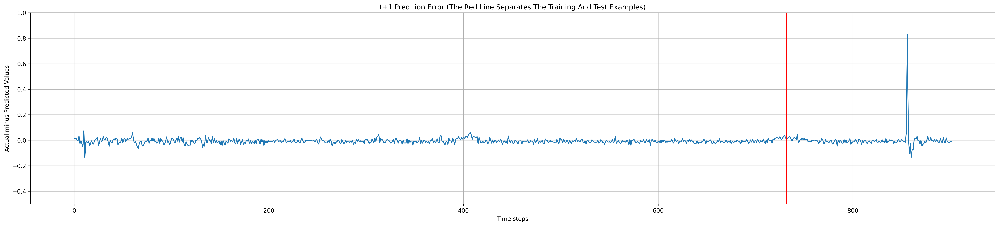

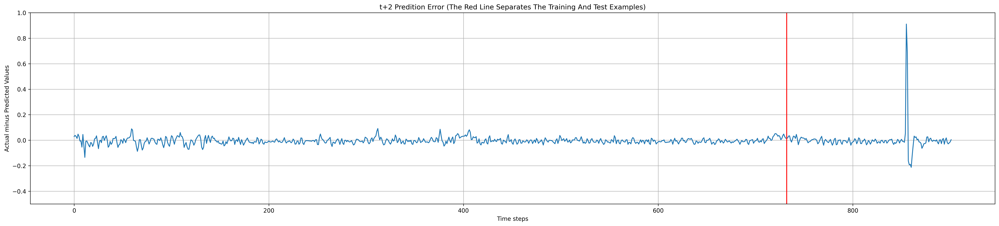

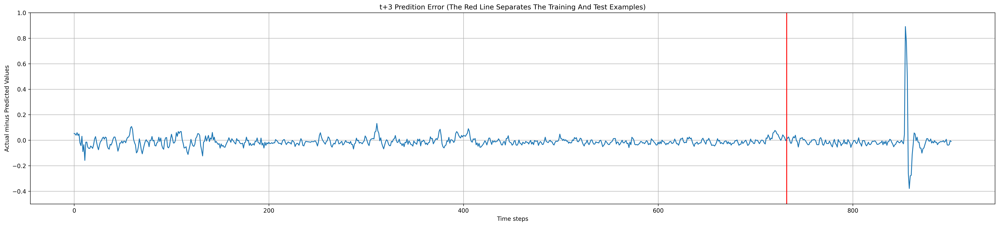

In [ ]:
print ('***** RNN MODEL *****')
train_predict = RNN_model.predict(X)
test_predict = RNN_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)


***** LINEAR MODEL *****


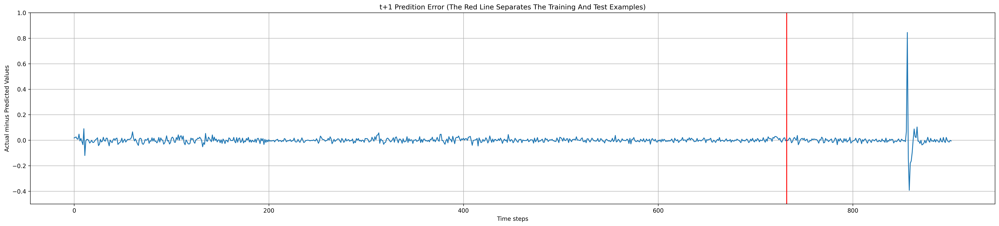

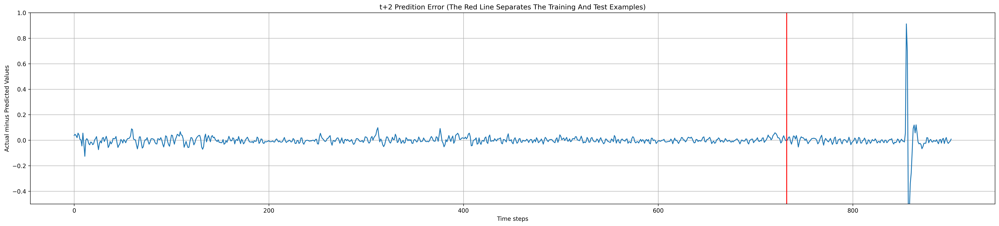

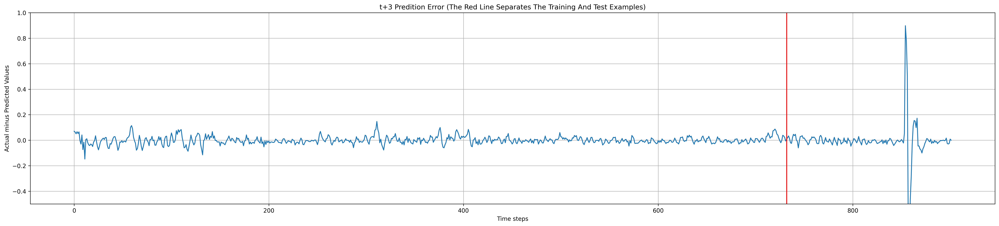

In [ ]:
print ('***** LINEAR MODEL *****')
train_predict = linear_model.predict(X)
test_predict = linear_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

***** MLP MODEL *****
6/6 [==============================] - 0s 2ms/step


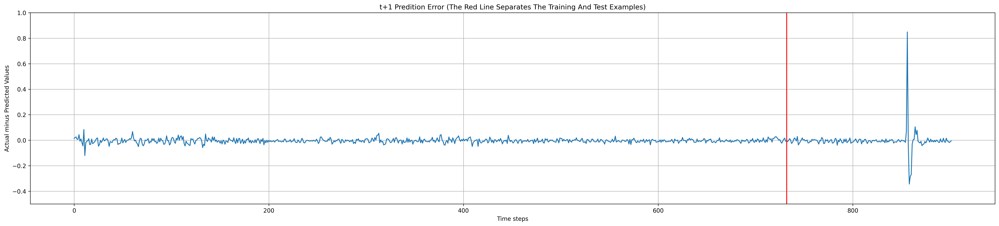

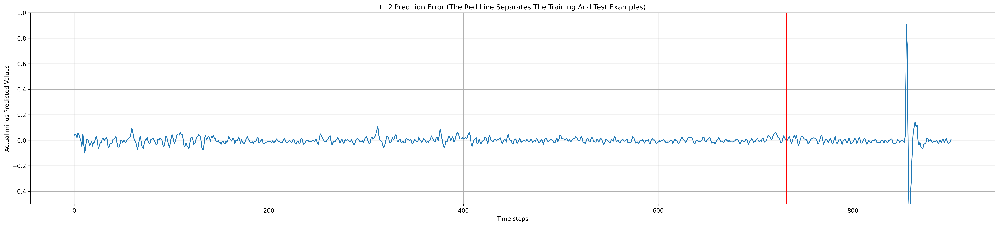

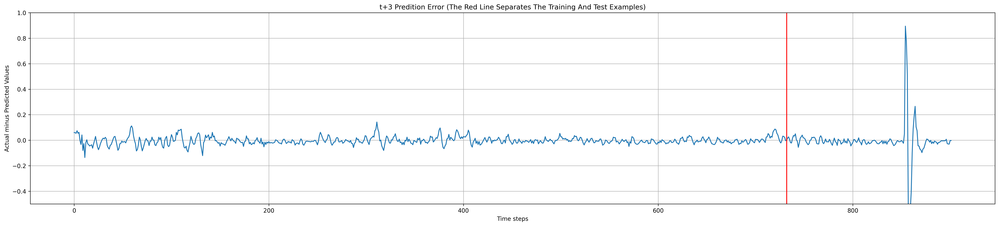

In [ ]:
print ('***** MLP MODEL *****')
train_predict = MLP_model.predict(X)
test_predict = MLP_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

***** LSTM MODEL *****
6/6 [==============================] - 0s 4ms/step


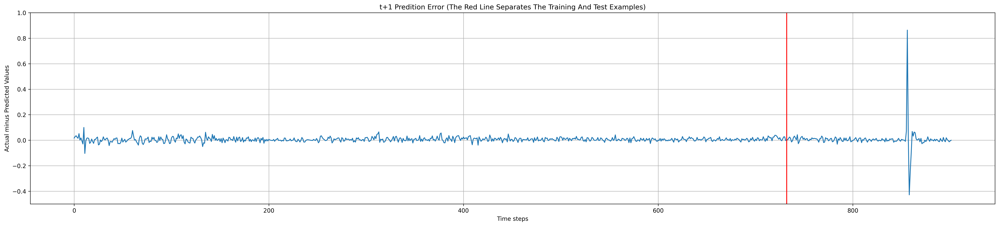

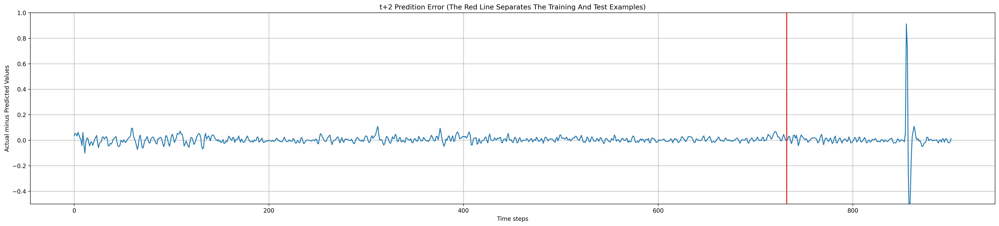

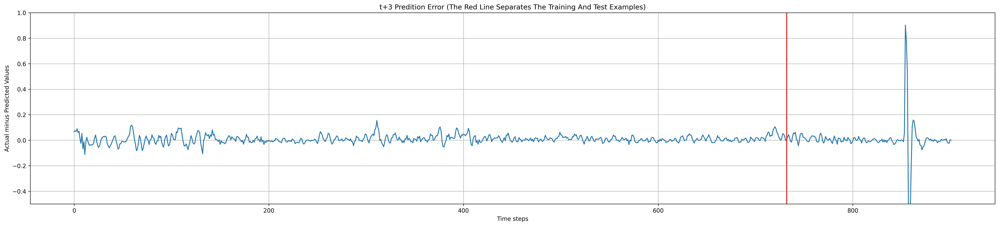

In [ ]:
print ('***** LSTM MODEL *****')
train_predict = LSTM_model.predict(X)
test_predict = LSTM_model.predict(Xt)
plot_error_predict(train_predict, test_predict, y, yt)

## **Exhibit a dataframe with the final results for each predictor**

In [ ]:
DF_results = pd.concat([df1, df2, df3, df4], axis=1, keys=['RNN', 'LINEAR', 'MLP', 'LSTM'])
DF_results.index = ['t+1', 't+2', 't+3']
DF_results

RNN              LINEAR                 MLP                LSTM  \
        train      test     train      test     train      test     train   
t+1  0.019032  0.067849  0.015883  0.076998  0.016792  0.078627  0.017412   
t+2  0.023721  0.094606  0.022425  0.114303  0.023109  0.115544  0.023358   
t+3  0.032306  0.111839  0.029590  0.141454  0.030085  0.138753  0.031458   

               
         test  
t+1  0.078405  
t+2  0.111095  
t+3  0.136591

## **Use the SimpleRNN model to make a search for the best [time_steps].**

In [ ]:
time_steps = [1, 2, 7, 11, 50]
horizon = 3
DF1 = pd.DataFrame()

for timesteps in time_steps:
    X, y, Xt, yt = get_train_test('/content/drive/MyDrive/Projetos Computacionais - Redes Neurais/Projetos 2/unemployment_rate.csv', 0.8, timesteps, horizon)
    RNN_model = RNN_predictor(X, y, timesteps)
    train_predict = RNN_model.predict(X)
    test_predict = RNN_model.predict(Xt)
    rmse  = RMSE(train_predict, test_predict)
    rmse.columns = pd.MultiIndex.from_product([[timesteps], rmse.columns])
    DF1 = pd.concat([DF1, rmse], axis=1)

          t-0       t+1       t+2       t+3
0    0.073171  0.105691  0.121951  0.113821
1    0.105691  0.121951  0.113821  0.081301
2    0.121951  0.113821  0.081301  0.089431
3    0.113821  0.081301  0.089431  0.089431
4    0.081301  0.089431  0.089431  0.113821
..        ...       ...       ...       ...
907  0.105691  0.105691  0.105691  0.097561
908  0.105691  0.105691  0.097561  0.097561
909  0.105691  0.097561  0.097561  0.097561
910  0.097561  0.097561  0.097561  0.113821
911  0.097561  0.097561  0.113821  0.105691

[912 rows x 4 columns]
Epoch 1/20
732/732 - 2s - loss: 0.0140 - 2s/epoch - 3ms/step
Epoch 2/20
732/732 - 1s - loss: 0.0012 - 1s/epoch - 2ms/step
Epoch 3/20
732/732 - 1s - loss: 8.5829e-04 - 1s/epoch - 2ms/step
Epoch 4/20
732/732 - 1s - loss: 8.6187e-04 - 1s/epoch - 2ms/step
Epoch 5/20
732/732 - 1s - loss: 8.5602e-04 - 1s/epoch - 2ms/step
Epoch 6/20
732/732 - 1s - loss: 8.7198e-04 - 1s/epoch - 2ms/step
Epoch 7/20
732/732 - 2s - loss: 8.8930e-04 - 2s/epoch - 3ms/step
E

In [ ]:
DF1.index = ['t+1', 't+2', 't+3']
DF1

1                   2                   7                   11  \
        train      test     train      test     train      test     train   
t+1  0.020936  0.068327  0.022221  0.068334  0.017016  0.066871  0.030681   
t+2  0.030285  0.094070  0.027259  0.093143  0.023639  0.093682  0.038271   
t+3  0.036925  0.107730  0.035575  0.108722  0.033266  0.111844  0.041288   

                     50            
         test     train      test  
t+1  0.074332  0.016934  0.079119  
t+2  0.101737  0.021683  0.112047  
t+3  0.115731  0.028189  0.132550

## **Use the LSTM model to make a search for the best [time_steps].**

In [ ]:
time_steps = [1, 2, 7, 11, 50]
horizon = 3
DF2 = pd.DataFrame()

for timesteps in time_steps:
    X, y, Xt, yt = get_train_test('/content/drive/MyDrive/Projetos Computacionais - Redes Neurais/Projetos 2/unemployment_rate.csv', 0.8, timesteps, horizon)
    LSTM_model = LSTM_predictor(X, y, timesteps)
    train_predict = LSTM_model.predict(X)
    test_predict = LSTM_model.predict(Xt)
    rmse  = RMSE(train_predict, test_predict)
    rmse.columns = pd.MultiIndex.from_product([[timesteps], rmse.columns])
    DF2 = pd.concat([DF2, rmse], axis=1)

          t-0       t+1       t+2       t+3
0    0.073171  0.105691  0.121951  0.113821
1    0.105691  0.121951  0.113821  0.081301
2    0.121951  0.113821  0.081301  0.089431
3    0.113821  0.081301  0.089431  0.089431
4    0.081301  0.089431  0.089431  0.113821
..        ...       ...       ...       ...
907  0.105691  0.105691  0.105691  0.097561
908  0.105691  0.105691  0.097561  0.097561
909  0.105691  0.097561  0.097561  0.097561
910  0.097561  0.097561  0.097561  0.113821
911  0.097561  0.097561  0.113821  0.105691

[912 rows x 4 columns]
Epoch 1/200
23/23 - 3s - loss: 0.0665 - 3s/epoch - 123ms/step
Epoch 2/200
23/23 - 0s - loss: 0.0447 - 69ms/epoch - 3ms/step
Epoch 3/200
23/23 - 0s - loss: 0.0269 - 66ms/epoch - 3ms/step
Epoch 4/200
23/23 - 0s - loss: 0.0155 - 58ms/epoch - 3ms/step
Epoch 5/200
23/23 - 0s - loss: 0.0103 - 60ms/epoch - 3ms/step
Epoch 6/200
23/23 - 0s - loss: 0.0091 - 62ms/epoch - 3ms/step
Epoch 7/200
23/23 - 0s - loss: 0.0086 - 70ms/epoch - 3ms/step
Epoch 8/200
23

In [ ]:
DF2.index = ['t+1', 't+2', 't+3']
DF2

1                   2                   7                   11  \
        train      test     train      test     train      test     train   
t+1  0.017496  0.067553  0.019838  0.072494  0.017573  0.076907  0.016345   
t+2  0.026198  0.095899  0.027222  0.094695  0.022769  0.105521  0.023596   
t+3  0.035119  0.111202  0.035542  0.110450  0.030220  0.127891  0.031376   

                     50            
         test     train      test  
t+1  0.078615  0.016258  0.087930  
t+2  0.112184  0.022180  0.124923  
t+3  0.136639  0.028913  0.153237

# **GRÁFICOS PARA AUXILIAR NAS RESPOSTAS**

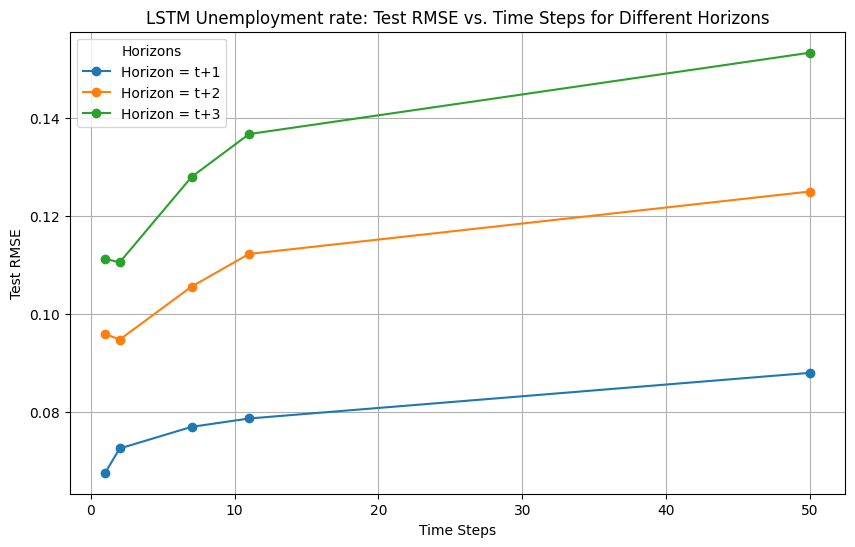

In [ ]:
import matplotlib.pyplot as plt

# Extraímos os time_steps e os horizontes
time_steps = [1, 2, 7, 11, 50]
horizons = DF2.index

# Inicializar o gráfico
plt.figure(figsize=(10, 6))

# Plotar uma linha para cada horizonte
for horizon in horizons:
    test_rmse_values = DF2.loc[horizon, (slice(None), 'test')].values
    plt.plot(time_steps, test_rmse_values, marker='o', linestyle='-', label=f'Horizon = {horizon}')

# Configurar o gráfico
plt.title('LSTM Unemployment rate: Test RMSE vs. Time Steps for Different Horizons')
plt.xlabel('Time Steps')
plt.ylabel('Test RMSE')
plt.legend(title='Horizons')
plt.grid(True)
plt.show()



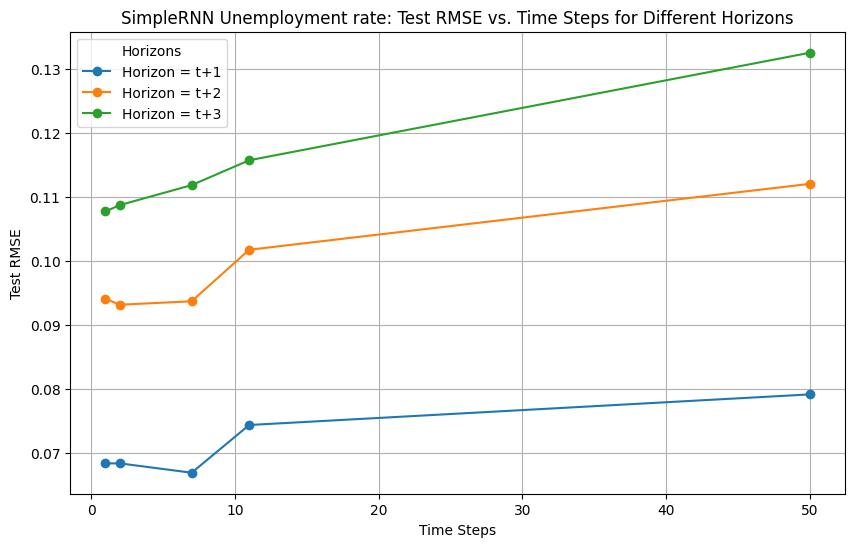

In [ ]:
import matplotlib.pyplot as plt

# Extraímos os time_steps e os horizontes
time_steps = [1, 2, 7, 11, 50]
horizons = DF1.index

# Inicializar o gráfico
plt.figure(figsize=(10, 6))

# Plotar uma linha para cada horizonte
for horizon in horizons:
    test_rmse_values = DF1.loc[horizon, (slice(None), 'test')].values
    plt.plot(time_steps, test_rmse_values, marker='o', linestyle='-', label=f'Horizon = {horizon}')

# Configurar o gráfico
plt.title('SimpleRNN Unemployment rate: Test RMSE vs. Time Steps for Different Horizons')
plt.xlabel('Time Steps')
plt.ylabel('Test RMSE')
plt.legend(title='Horizons')
plt.grid(True)
plt.show()


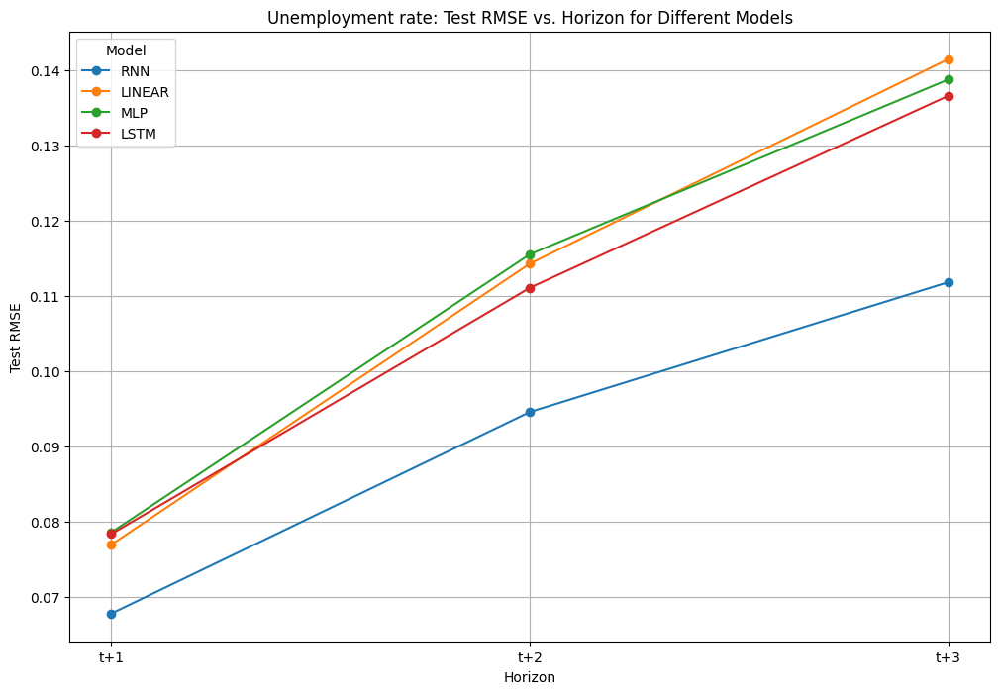

In [ ]:
import matplotlib.pyplot as plt

# Definindo os modelos e horizontes
models = DF_results.columns.levels[0]
horizons = DF_results.index

# Inicializando o gráfico
plt.figure(figsize=(12, 8))

# Iterando sobre os modelos
for model in models:
    # Obtendo os valores de RMSE para cada modelo
    rmse_values = DF_results[model]['test'].values
    # Plotando a curva para cada modelo
    plt.plot(horizons, rmse_values, marker='o', linestyle='-', label=model)

# Configurando o gráfico
plt.title('Unemployment rate: Test RMSE vs. Horizon for Different Models')
plt.xlabel('Horizon')
plt.ylabel('Test RMSE')
plt.legend(title='Model')
plt.grid(True)
plt.show()


<font color="green">
Atividade (a) <br>
Explique o papel dos parâmetros de projeto [time_steps] e [horizon]. <br>
</font>

**Resposta:**<BR>

* O parâmetro **[time_steps]** determina quantos valores anteriores serão considerados (a dimensão temporal dos dados de entrada). Por exemplo, se queremos prever o valor no instante $t+1$ e definimos **[time_steps]** como 5, utilizaremos os valores nos instantes $t-0$, $t-1$, $t-2$, $t-3$ e $t-4$ para realizar a previsão. Nas redes treinadas, foram utilizados 11 **[time_steps]**.


* O parâmetro **[horizon]** especifica quantos instantes no futuro a rede deve prever. Por exemplo, se queremos prever 3 instantes futuro a partir de $t$, teremos no **[horizon]** os instantes $t+1$, $t+2$ e $t+3$. No nosso caso, foi definido como 3, então a série temporal prevê os valores dos 3 próximos instantes.

Portanto, o **time_steps** define quantos passos de tempo anteriores são considerados como entrada e o **horizon** define quantos passos de tempo à frente serão previstos pelo modelo.



<font color="green">
Atividade (b) <br>
Qual a diferença no uso do parâmetro [time_steps] no caso dos preditores não-recorrentes e no caso do bloco LSTM? <br>
</font>

**Resposta:**<BR>

* No caso do bloco ***LSTM*** o **[time_steps]** mostra o número de recorrência da rede, ou ainda, o número de desdobramento da rede recorrente. Isto é, o número de tempos anteriores que são considerados para a previsão da série temporal.

* Para **preditores não-recorrentes**, como uma MLP, o parâmetro **[time_steps]** corresponde à dimensão da entrada, refletindo a quantidade de valores anteriores incluídos diretamente na entrada do modelo.



<font color="green">
Atividade (c) <br>
Qual modelo de predição levou a um melhor desempenho junto aos dados de teste em cada caso? <br>
</font>

**Resposta:**<BR>

*   No caso da **Unemployment rate** o modelo RNN obteve o melhor desempenho junto ao conjunto de teste em todos os 3 **[horizon]** analisados, como podemos observar no gráfico **"Unemployment rate: Test RMSE vs. Horizon for Different Models"** do **PC08_RNNs_MLP_LP_TS_unemployment_rat**.
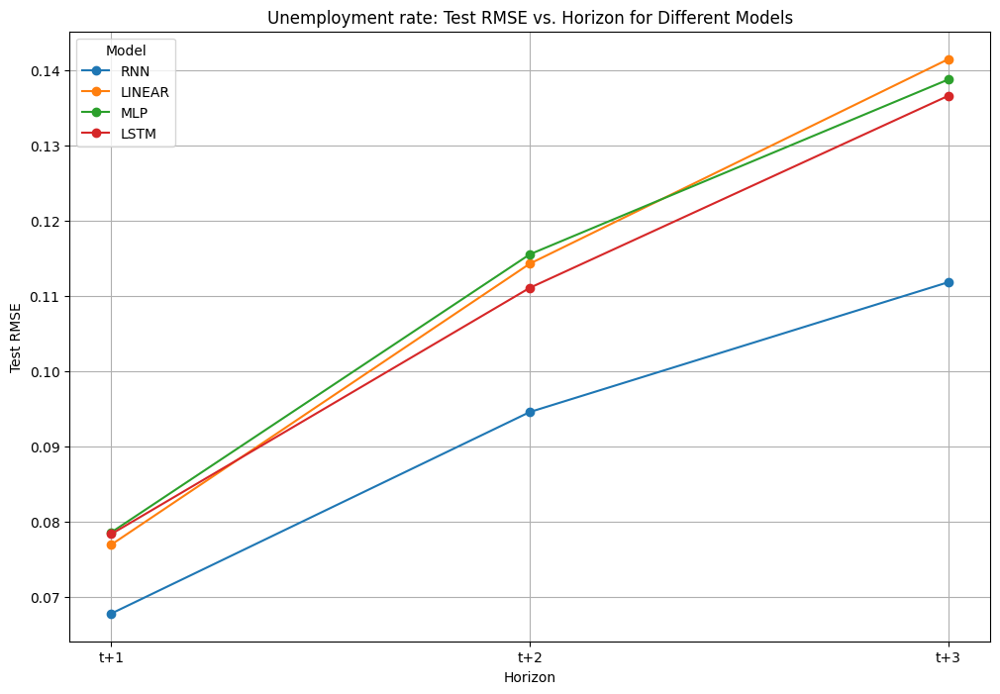

*   No caso da **Sunspot** o modelo MLP obteve o melhor desempenho junto ao conjunto de teste nos dois primeiros **[horizon]**, $t+1$ e $t+2$. Porém, no **[horizon]** $t+3$ ele foi superado pelo modelo Linear, como podemos observar no gráfico **"Sunspot: Test RMSE vs. Horizon for Different Models"** do **PC08_RNNs_MLP_LP_TS_SUNSPOT**. Como o modelo Linear ficou bem próximo do modelo MLP, exceto no último tempo que percebemos uma maior variação, podemos dizer que o modelo Linear obteve o melhor desempenho de forma geral.
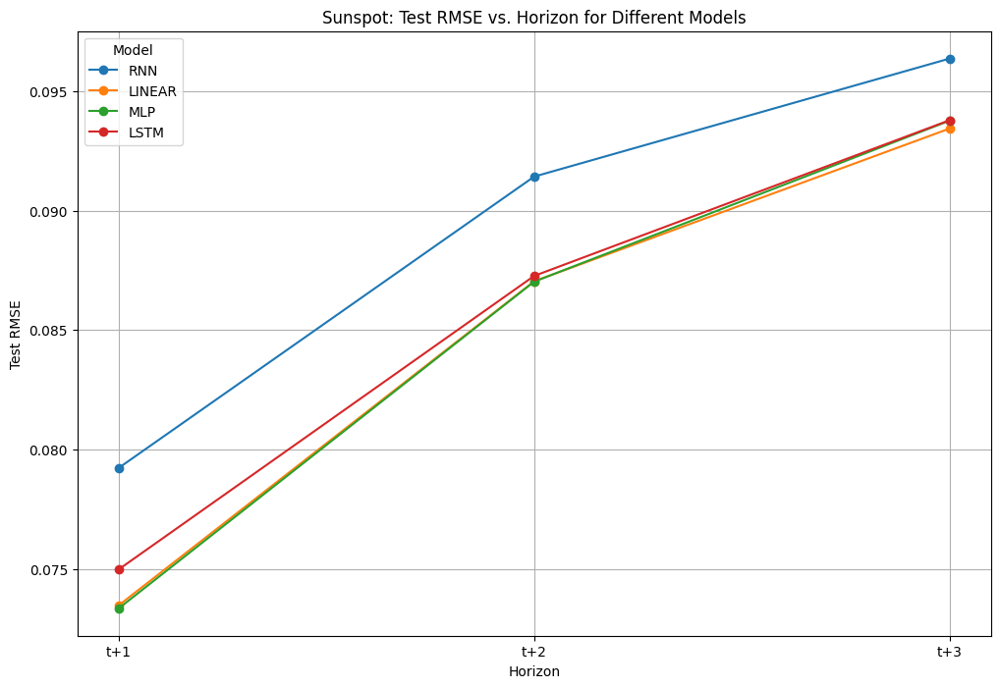

<font color="green">
Atividade (d) <br>
Ao se variar o [horizon], apresente uma hipótese para a perda de desempenho conforme [horizon] cresce de 1 até 3, comportamento produzido por todos os modelos de predição, nos dois casos de estudo. <br>
</font>

**Resposta:**<BR>

Ao se variar o **[horizon]** a *performance* do modelo pode diminuir, como mostra as figuras do item anterior, devido a alguns possíveis fatores, sendo eles:


1. **Propagação de Erros:** Podem ocorrer erros nas previsões anteriores e eles se acumularem, consequentemente, serem propagados em previsões subsequentes.
2. **Redução da Informação Relevante:** As observações mais recentes são mais úteis para previsões de curto prazo. Em horizontes maiores, essa relevância diminui.
3. **Complexidade e Incerteza:** É evidente que quanto maior o tempo no futuro mais eventos extremos ou inesperados podem ocorrer, como é o caso da pandemia.
4. **Limitações dos Modelos:** Mesmo modelos avançados como RNN e LSTM têm dificuldades em manter dependências de longo prazo, o que afeta a precisão em horizontes maiores.

<font color="green">
Atividade (e) <br>
Ao se variar o [time_steps] especificamente para os modelos SimpleRNN e LSTM, procure explicar o comportamento observado em cada caso de estudo.<br>
</font>

 **Resposta:**<BR>



   *   **Unemployment rate:**
  *   LSTM:

Pelo gráfico abaixo podemos observar que o RMSE aumenta conforme todos os horizontes de previsão, $t+1, t+2$ e $t+3$ se estende. O erro também aumenta com o aumento dos **[time_steps]**, mas de forma mais singela em comparação com o aumento do horizonte. Como o conjunto de dados pega o intervalo da pandemia, entende-se que este é um dos possíveis fatores para o aumento do erro, uma vez que tornou as previsões mais difíceis. Além disso, o acúmulo de erros conforme o **[horizon]** de previsão aumenta também pode ter influenciado no erro final.  Por fim, na LSTM mais **[time_steps]** pode ajudar a capturar mais informações, mas também pode introduzir ruído adicional, dificultando a distinção entre padrões úteis e ruído.

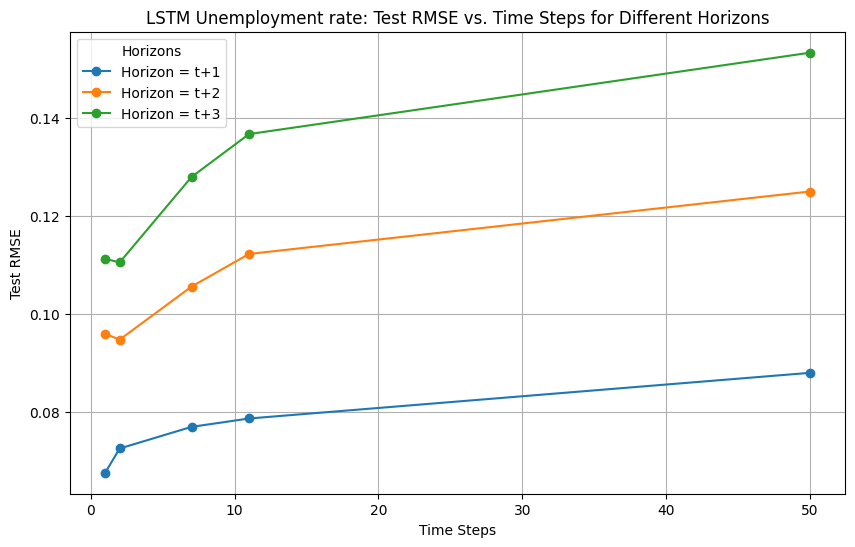
  
  
  
  
  
  
  
  
  
  *   SimpleRNN:

O comportamento da série temporal com o modelo SimpleRNN é muito similar ao modelo LSTM, apenas com pequenas variações de diminuição do erro para horizontes pequenos, $t+1$ e $t+2$ e **[time_steps]** pequenos também. No mais, tanto as hipóteses e análise do comportamento segue a mesma ideia do caso anterior.



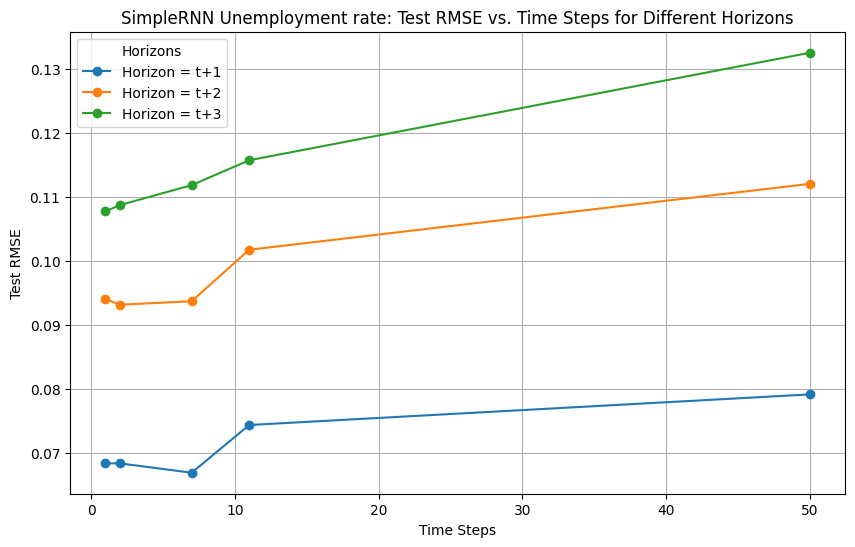


Ambos os gráficos do **Unemployment rate** mostram que, para esta série temporal, o desempenho dos modelos de previsão tendem a diminuir a medida que os **[time_steps]** aumentam. Além disso, **[horizon]** menores têm erros menores em relação a horizontes maiores.


*   **Sunspot:**

  *   LSTM:

No começo, os erros são maiores para **[time_steps]** menores, até o **[time_steps]** 11. Após isso, o RMSE estabiliza e até aumenta levemente, o que mostra que o benefício de adicionar mais passos de tempo diminui após esse ponto. Em relação aos **[horizon]**, observamos que para horizontes mais curtos $t+1$, o modelo LSTM consegue capturar a informação relevante com menos **[time_steps]**. As previsões de longo prazo $t+2$ e $t+3$, o erro tende a se propagar e amplificar ao longo do tempo, resultando em RMSE mais alto. Ainda, o **[time_steps]** 11 é um ponto de saturação, o que mostra que **[time_steps]** não contribuem significativamente para a melhoria da previsão.

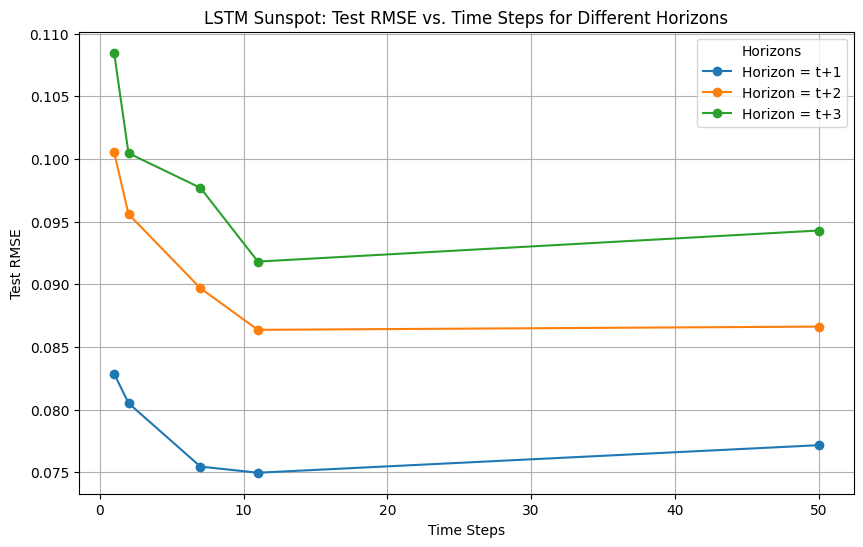


  *   SimpleRNN:

Nesse caso, podemos observar que inicialmente os erros são maiores e apresentam pequenas variações com o aumento dos **[time_steps]** até o 11. Após isso, o RMSE estabiliza e diminui gradualmente, indicando uma melhoria contínua na previsão com mais passos de tempo, isto é, o modelo começa a capturar padrões relevantes.
Podemos notar dependência temporal, ou seja, mais **[time_steps]** fornecem mais contexto, ajudando o modelo a identificar e prever tendências e padrões cíclicos. Além disso, em relação aos **[horizon]**, observamos que para horizontes mais curtos $t+1$, o modelo SimpleRNN consegue capturar a informação relevante com menos **[time_steps]**. À medida que o horizonte de previsão aumenta, precisamos de mais dados para manter a precisão. No caso caso de previsões de longo prazo $t+2$ e $t+3$, o erro tende a se propagar e amplificar ao longo do tempo, resultando em RMSE mais alto.




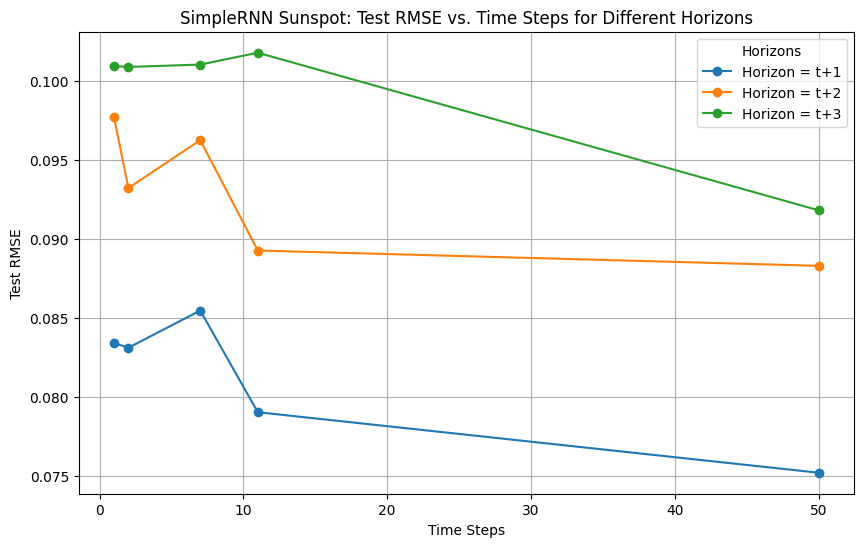


Ambos os gráficos do **Sunspot** mostram que, para esta série temporal, o desempenho dos modelos de previsão melhora com o aumento dos **[time_steps]** até um ponto de saturação. O LSTM, devido à sua arquitetura, lida melhor com horizontes de previsão mais longos e apresenta uma diminuição mais consistente no RMSE com o aumento dos **[time_steps]**, em comparação ao SimpleRNN. A propagação de erro é a principal hipótese para a causa da perda de desempenho conforme o horizonte de previsão aumenta.